<a href="https://colab.research.google.com/github/bassemr/one-short-learning/blob/main/notebooks/One_shot_learning_with_Cifar100_dataset2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# One shot learning with Cifar100 dataset

## 0. Computer vision libraries in PyTorch

* [`torchvision`] - base domain library for PyTorch computer vision
* `torchvision.dataset` - get dataset and data loading functions for computer vision
* `torchvision.models` - get pretrained computer vision models that can leverage for your own problems
* `torchvision.transforms` - function for manipulating your vision data (images) to be suitable for use with an ML model
* `torch.utils.data.Dataset` - Base dataset class for PyTorch.
* `torch.utils.data.DataLoader` - Create a Python iterable over a dataset


In [10]:
# Import PyTorch
import torch
from torch import nn
# Setup training data
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision import transforms

# Import torchvision
import torchvision
from torchvision import datasets
from torchvision.transforms import ToTensor

# Import matplotlib for visualization
import matplotlib.pyplot as plt
# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Check versions
# Note: your PyTorch version shouldn't be lower than 1.10.0 and torchvision version shouldn't be lower than 0.11
print(f"PyTorch version: {torch.__version__}\ntorchvision version: {torchvision.__version__}")

[INFO] Couldn't find torchinfo... installing it.
PyTorch version: 2.8.0+cu126
torchvision version: 0.23.0+cu126


## 1. Getting a dataset

The dataset we'll be using is FashionMNIST from torchvision.datasets - https://pytorch.org/vision/stable/generated/torchvision.datasets.CIFAR100.html

In [10]:
# Setup training data
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision import transforms

train_data = datasets.CIFAR100(
    root='data', # where to download data to?
    train=True, # do we want the training dataset?
    download=False, # do we want to download yes/no
    transform=ToTensor(), # how do we want to transform the data?
    target_transform=None # how do we want to transforms the labels/targets?
)

test_data = datasets.CIFAR100(
    root="data",
    train=False,
    download=False,
    transform=ToTensor(),
    target_transform=None
)

In [11]:
# See first training sample
image, label = train_data[0]
image, label

(tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.7647, 0.8314, 0.7137],
          [1.0000, 0.9961, 0.9961,  ..., 0.6667, 0.6314, 0.5725],
          [1.0000, 0.9961, 1.0000,  ..., 0.7412, 0.6510, 0.4745],
          ...,
          [0.5804, 0.5569, 0.5490,  ..., 0.1176, 0.2549, 0.2980],
          [0.4784, 0.4706, 0.4941,  ..., 0.0863, 0.3804, 0.5529],
          [0.3412, 0.3451, 0.3961,  ..., 0.1333, 0.4118, 0.5412]],
 
         [[1.0000, 1.0000, 1.0000,  ..., 0.8039, 0.8784, 0.7608],
          [1.0000, 0.9961, 0.9961,  ..., 0.6902, 0.6588, 0.6039],
          [1.0000, 0.9961, 1.0000,  ..., 0.7804, 0.6980, 0.5216],
          ...,
          [0.7255, 0.7137, 0.7020,  ..., 0.0667, 0.2431, 0.3020],
          [0.6157, 0.6078, 0.6275,  ..., 0.0627, 0.4392, 0.6314],
          [0.4784, 0.4784, 0.5255,  ..., 0.1412, 0.5216, 0.6784]],
 
         [[1.0000, 1.0000, 1.0000,  ..., 0.7569, 0.8000, 0.6549],
          [1.0000, 0.9961, 0.9961,  ..., 0.5882, 0.5098, 0.4431],
          [1.0000, 0.9961, 1.0000,  ...,

### 1.1 Input and output shapes of a computer vision model
We've got a big tensor of values (the image) leading to a single value for the target (the label).

Let's see the image shape.

In [20]:
# What's the shape of the image?
image.shape # [color_channels=3, height=32, width=32]

torch.Size([3, 32, 32])

* Let's check out more shapes of our data.

In [13]:
# How many samples are there?
print(f"train data: {len(train_data.data)}, train target: {len(train_data.targets)}")
print(f"test data: {len(test_data.data)} , test target: {len(test_data.targets)}") #50,000 training samples and 10,000 testing samples.

train data: 50000, train target: 50000
test data: 10000 , test target: 10000


What classes are there?

We can find these via the `.classes` attribute.

In [14]:
# See classes
class_names = train_data.classes
class_names, len(class_names)

(['apple',
  'aquarium_fish',
  'baby',
  'bear',
  'beaver',
  'bed',
  'bee',
  'beetle',
  'bicycle',
  'bottle',
  'bowl',
  'boy',
  'bridge',
  'bus',
  'butterfly',
  'camel',
  'can',
  'castle',
  'caterpillar',
  'cattle',
  'chair',
  'chimpanzee',
  'clock',
  'cloud',
  'cockroach',
  'couch',
  'crab',
  'crocodile',
  'cup',
  'dinosaur',
  'dolphin',
  'elephant',
  'flatfish',
  'forest',
  'fox',
  'girl',
  'hamster',
  'house',
  'kangaroo',
  'keyboard',
  'lamp',
  'lawn_mower',
  'leopard',
  'lion',
  'lizard',
  'lobster',
  'man',
  'maple_tree',
  'motorcycle',
  'mountain',
  'mouse',
  'mushroom',
  'oak_tree',
  'orange',
  'orchid',
  'otter',
  'palm_tree',
  'pear',
  'pickup_truck',
  'pine_tree',
  'plain',
  'plate',
  'poppy',
  'porcupine',
  'possum',
  'rabbit',
  'raccoon',
  'ray',
  'road',
  'rocket',
  'rose',
  'sea',
  'seal',
  'shark',
  'shrew',
  'skunk',
  'skyscraper',
  'snail',
  'snake',
  'spider',
  'squirrel',
  'streetcar',
  

### 1.2 Visualizing our data


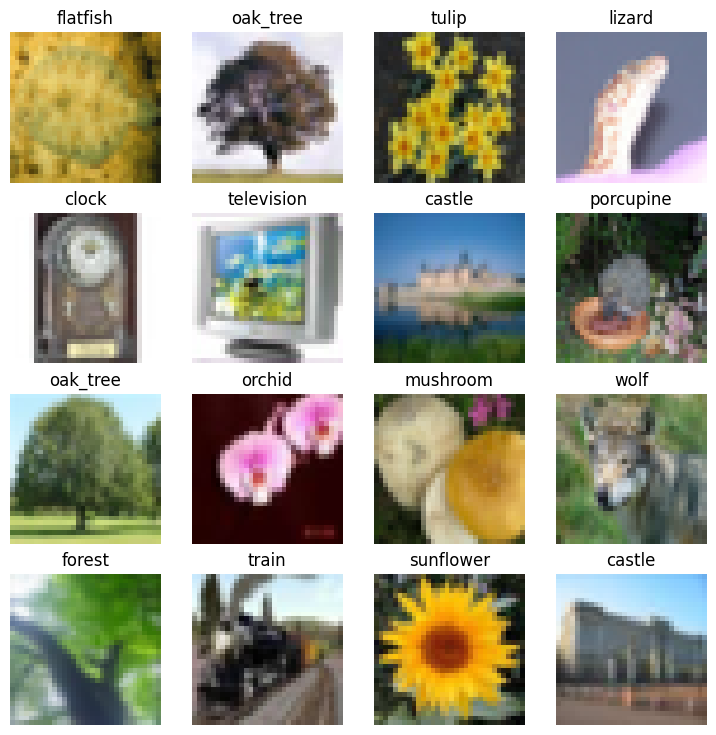

In [17]:
# Plot more images
torch.manual_seed(42)
fig = plt.figure(figsize=(9, 9))
rows, cols = 4, 4
for i in range(1, rows * cols + 1):
    random_idx = torch.randint(0, len(train_data), size=[1]).item()

    img, label = train_data[random_idx]
    fig.add_subplot(rows, cols, i)
    plt.imshow(img.permute(1, 2, 0))  # from (C,H,W) -> (H,W,C)
    plt.axis("off")
    plt.title(class_names[label])

## 2. Preparing our data


### 2.1 get a clone of the project from github




The project link - https://github.com/bassemr/one-short-learning.git

In [1]:
!pwd

/content


In [2]:
def git_project():
  !git clone https://github.com/bassemr/one-short-learning.git
  %cd /content/one-short-learning
def update_git():
  %cd /content/one-short-learning
  !git fetch origin
  !git merge origin/main

In [3]:
git_project()

Cloning into 'one-short-learning'...
remote: Enumerating objects: 97, done.
remote: Counting objects: 100% (97/97), done.
remote: Compressing objects: 100% (69/69), done.
remote: Total 97 (delta 54), reused 58 (delta 22), pack-reused 0 (from 0)
Receiving objects: 100% (97/97), 4.21 MiB | 8.53 MiB/s, done.
Resolving deltas: 100% (54/54), done.
/content/one-short-learning


In [4]:
!pwd
!ls /content/one-short-learning/siamese/

/content/one-short-learning
data_utils.py  helper_functions.py  models.py  test.py	train.py


### 2.2 get the train/valid/test data from `data_utils.py`

In [5]:
# import data.utils.py
import sys
sys.path.append("/content/one-short-learning/siamese") # my python's files are inside siamese folder
from data_utils import prepare_data

`prepare_data(root,
            num_training_classes,
            pos_num_pairs
            neg_num_pairs,
            batch_size,
            img_size=224)`

Prepare data loaders and few-shot test dataset for CIFAR-100.

Steps:
* Load the full CIFAR-100 dataset (train + test combined).
* Split dataset into seen (training) and unseen (test) classes.
* Apply transformations to unseen/test dataset.
* Generate positive and negative pairs from seen classes for Siamese training.
* Split pairs into training and validation loaders.
* Prepare few-shot test dataset from unseen classes.

Args:
* root (str): Path to CIFAR-100 data folder.
* num_training_classes (int): Number of seen classes used for training.
* pos_num_pairs (int): Number of positive pairs per class for training.
* neg_num_pairs (int): Number of negative pairs per class for training.
* batch_size (int): Batch size for training and validation loaders.
* img_size (int, optional): Size to which images are resized. Defaults to 224.

Returns:
* train_loader (DataLoader): Training loader with positive/negative pairs.
* valid_loader (DataLoader): Validation loader.
* test_data (Dataset): Few-shot test dataset from unseen classes.
    

In [16]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 90
pos_num_pairs = 250
neg_num_pairs = 250
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, test_data = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size
)


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 54000
[INFO] Unseen dataset size: 6000
[INFO] Test dataset (unseen classes) size: 6000
[INFO] Total pairs generated for training: 44977
[INFO] Number of batches - Train: 633, Validation: 71
[INFO] Support Images shape: torch.Size([10, 3, 224, 224])
[INFO] Support Labels shape: torch.Size([10])
[INFO] Query Images shape: torch.Size([40, 3, 224, 224])
[INFO] Query Labels shape: torch.Size([40])


### 2.3 Visualize pairs

In [7]:
from helper_functions import visualize_pairs

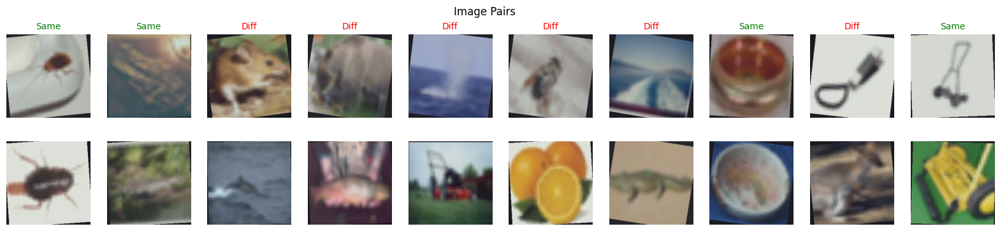

In [8]:
visualize_pairs(train_loader, n=10)

## 3. Create Siamese Network (ResNet18)

Project Goal
We are not trying to classify an image into its class.
Instead, our task is to determine whether two images are similar or not.

**Model Requirements** :

* Input: a pair of images.

* Output: a single value representing their similarity (e.g., how close or different they are).

### 3.1 Import Our Model


In [17]:
from models import SiameseResNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
net = SiameseResNet(embedding_size=128).to(device)


In [18]:
# freeze the model until layer 4
net.freeze_until(4)

# show model's summary
net.summary(input_size=(64, 3, 224, 224), verbose=0)

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
SiameseResNet (SiameseResNet)                 [64, 3, 224, 224]    [64, 1]              513,000              Partial
├─Sequential (encoder)                        [64, 3, 224, 224]    [64, 512, 1, 1]      --                   Partial
│    └─Conv2d (0)                             [64, 3, 224, 224]    [64, 64, 112, 112]   (9,408)              False
│    └─BatchNorm2d (1)                        [64, 64, 112, 112]   [64, 64, 112, 112]   (128)                False
│    └─ReLU (2)                               [64, 64, 112, 112]   [64, 64, 112, 112]   --                   --
│    └─MaxPool2d (3)                          [64, 64, 112, 112]   [64, 64, 56, 56]     --                   --
│    └─Sequential (4)                         [64, 64, 56, 56]     [64, 64, 56, 56]     --                   False
│    │    └─BasicBlock (0)                    [64, 64, 56, 56]     [64, 64, 56

## 4. Train the model

In [13]:
# Import train and create_writer
from train import train, create_writer

In [19]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 25
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen90",
    model_name="siamese_resnet18",
    extra="25_epochs_250_paris"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=5,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/25_epochs_250_paris...


Training:   0%|          | 0/25 [00:00<?, ?it/s]

Epoch [1/25] --> Train Loss: 0.6391, Train Acc: 0.6240 | Val Loss: 0.6363, Val Acc: 0.5977
  ✅ New best model saved
Epoch [2/25] --> Train Loss: 0.5944, Train Acc: 0.6776 | Val Loss: 0.6116, Val Acc: 0.6384
  ✅ New best model saved
Epoch [3/25] --> Train Loss: 0.5759, Train Acc: 0.6980 | Val Loss: 0.5599, Val Acc: 0.7058
  ✅ New best model saved
Epoch [4/25] --> Train Loss: 0.5593, Train Acc: 0.7128 | Val Loss: 0.5405, Val Acc: 0.7269
  ✅ New best model saved
Epoch [5/25] --> Train Loss: 0.5414, Train Acc: 0.7278 | Val Loss: 0.5062, Val Acc: 0.7554
  ✅ New best model saved
Epoch [6/25] --> Train Loss: 0.5221, Train Acc: 0.7437 | Val Loss: 0.4719, Val Acc: 0.7841
  ✅ New best model saved
Epoch [7/25] --> Train Loss: 0.5123, Train Acc: 0.7494 | Val Loss: 0.4871, Val Acc: 0.7765
  ⚠️ No improvement. Early stop counter: 1/5
Epoch [8/25] --> Train Loss: 0.4970, Train Acc: 0.7605 | Val Loss: 0.4423, Val Acc: 0.8052
  ✅ New best model saved
Epoch [9/25] --> Train Loss: 0.4865, Train Acc: 0.77

In [14]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 30
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen90",
    model_name="siamese_resnet18",
    extra="30_epochs_300_paris"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=5,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris...


Training:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch [1/30] --> Train Loss: 0.6699, Train Acc: 0.5777 | Val Loss: 0.6245, Val Acc: 0.6451
  ✅ New best model saved
Epoch [2/30] --> Train Loss: 0.6448, Train Acc: 0.6195 | Val Loss: 0.6111, Val Acc: 0.6279
  ✅ New best model saved
Epoch [3/30] --> Train Loss: 0.6349, Train Acc: 0.6308 | Val Loss: 0.6107, Val Acc: 0.6149
  ✅ New best model saved
Epoch [4/30] --> Train Loss: 0.6309, Train Acc: 0.6373 | Val Loss: 0.5702, Val Acc: 0.7255
  ✅ New best model saved
Epoch [5/30] --> Train Loss: 0.6246, Train Acc: 0.6433 | Val Loss: 0.5600, Val Acc: 0.7231
  ✅ New best model saved
Epoch [6/30] --> Train Loss: 0.6225, Train Acc: 0.6484 | Val Loss: 0.5569, Val Acc: 0.7283
  ✅ New best model saved
Epoch [7/30] --> Train Loss: 0.6190, Train Acc: 0.6515 | Val Loss: 0.5446, Val Acc: 0.7517
  ✅ New best model saved
Epoch [8/30] --> Train Loss: 0.6152, Train Acc: 0.6570 | Val Loss: 0.5393, Val Acc: 0.7454
  ✅ New best model saved
Epoch [9/30] --> Train Loss: 0.6146, Train Acc: 0.6546 | Val Loss: 0.531

KeyboardInterrupt: 

In [23]:
# Viewing TensorBoard in Jupyter and Google Colab Notebooks (uncomment to view full TensorBoard instance)
%load_ext tensorboard
%tensorboard --logdir /content/one-short-learning/runs

<IPython.core.display.Javascript object>

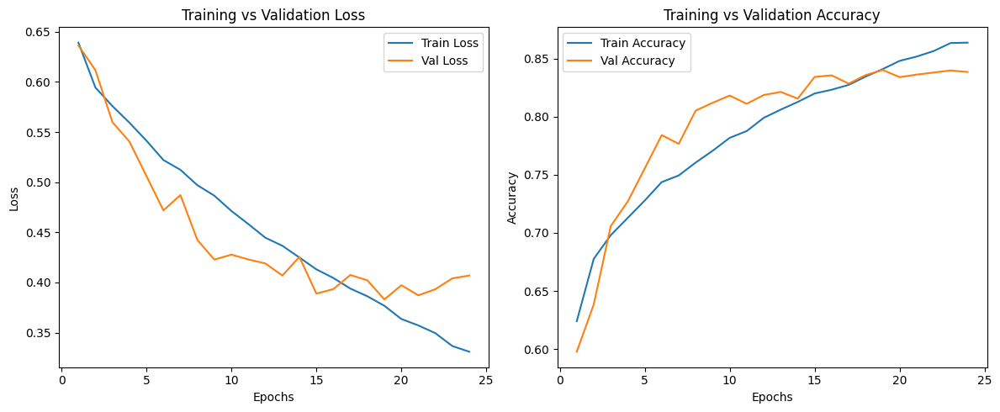

In [20]:
from helper_functions import plot_history
plot_history(history)

In [22]:
from train import save_model
from google.colab import files

save_model(best_model, "models", "modelv1.pth")
# Download the saved model file
files.download("models/modelv1.pth")

!zip -r runs.zip /content/one-short-learning/runs
files.download("runs.zip")


[INFO] Saving model to: models/modelv1.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  adding: content/one-short-learning/runs/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/Loss_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/Loss_val/events.out.tfevents.1759392997.73b5972d8485.2172.2 (deflated 42%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/events.out.tfevents.1759392207.73b5972d8485.2172.0 (deflated 9%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

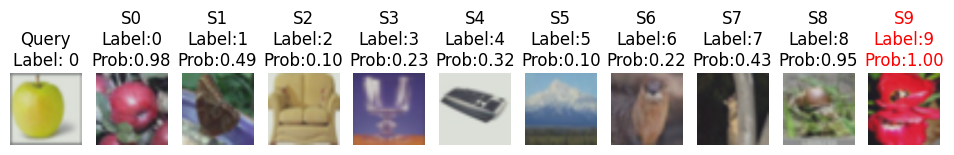

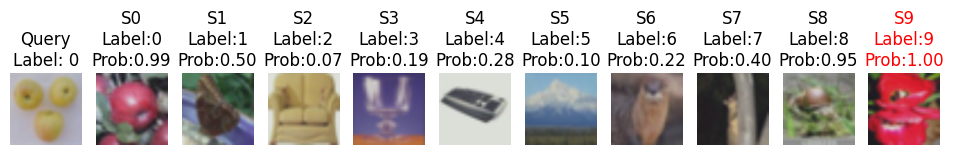

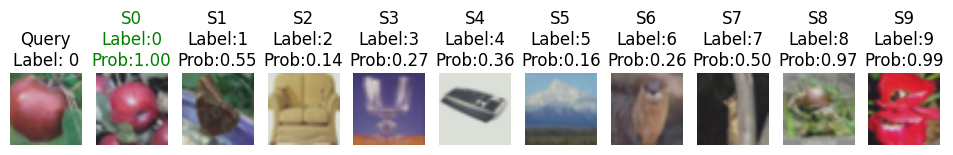

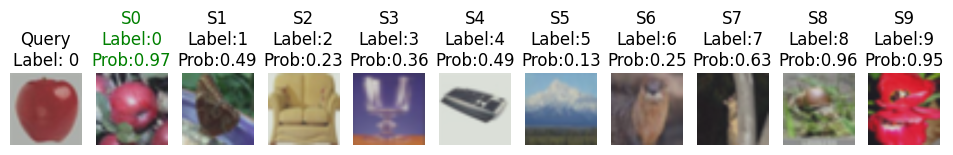

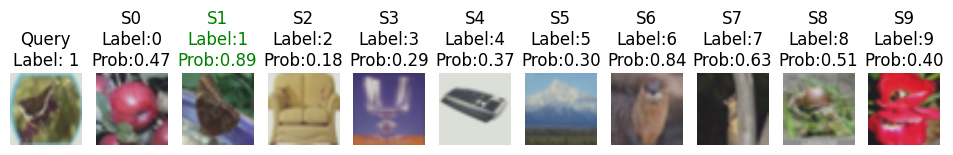

...

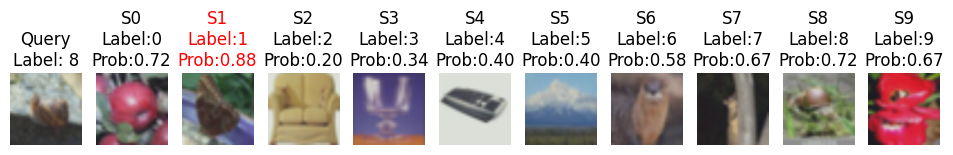

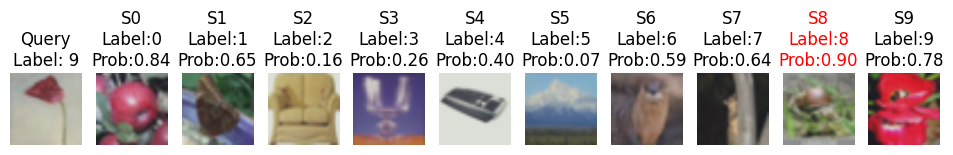

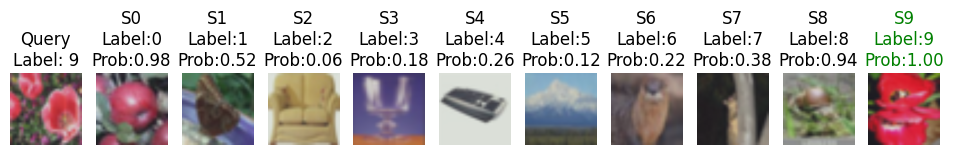

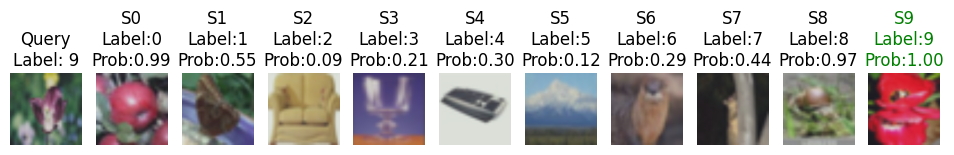

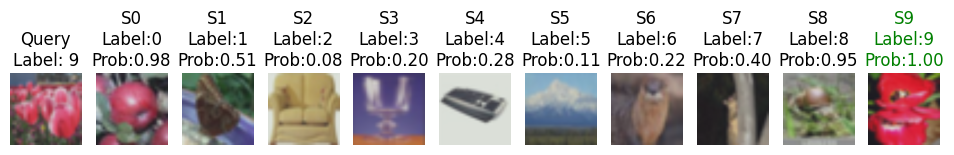

In [21]:
from helper_functions import show_query_support_probabilities
show_query_support_probabilities(net, test_data, device)

In [ ]:
import torch
import torch.nn.functional as F

def evaluate_all_episodes(model, test_dataset, device=device):
    """
    Evaluate SiameseResNet on episodic test data using vectorized batch computation.

    Args:
        model: Trained SiameseResNet.
        test_dataset: Iterable of episodes (dicts with support/query images & labels).
        device: "cuda" or "cpu".
    """
    model.eval()
    total_correct = 0
    total_samples = 0

    with torch.no_grad():
        for episode in test_dataset:
            support_images = episode["support_images"].to(device)   # [K, C, H, W]
            support_labels = episode["support_labels"].to(device)   # [K]
            query_images = episode["query_images"].to(device)       # [Q, C, H, W]
            query_labels = episode["query_labels"].to(device)       # [Q]

            Q, K = query_images.size(0), support_images.size(0)

            # Expand queries and supports into all pairs
            q_expanded = query_images.unsqueeze(1).expand(-1, K, -1, -1, -1)   # [Q, K, C, H, W]
            s_expanded = support_images.unsqueeze(0).expand(Q, -1, -1, -1, -1) # [Q, K, C, H, W]

            # Flatten for batch processing
            q_flat = q_expanded.reshape(Q*K, *query_images.shape[1:])  # [Q*K, C, H, W]
            s_flat = s_expanded.reshape(Q*K, *support_images.shape[1:])# [Q*K, C, H, W]

            # Forward pass through Siamese model
            logits = model(q_flat, s_flat)  # [Q*K, 1]
            probs = torch.sigmoid(logits).view(Q, K)  # reshape back to [Q, K]

            # Pick the support with max similarity for each query
            best_indices = torch.argmax(probs, dim=1)  # [Q]
            pred_labels = support_labels[best_indices] # [Q]

            # Accuracy
            total_correct += (pred_labels == query_labels).sum().item()
            total_samples += query_labels.size(0)

    accuracy = total_correct / total_samples
    print(f"One-shot test accuracy over all episodes: {accuracy:.4f}")
    return accuracy
accuracy = evaluate_all_episodes(net, test_data, device=device)
